In [3]:
import pandas as pd



In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import os

# Automatically detect all available methods (folders)
available_methods = []
for item in os.listdir('.'):
    if os.path.isdir(item) and item != 'outlines':  # Skip outlines folder
        available_methods.append(item)

print("Available methods:", available_methods)

# Load the real data (ground truth)
real_data = {
    'cells': pd.read_csv("real/Cells.csv"),
    'cytoplasm': pd.read_csv("real/Cytoplasm.csv"),
    'nuclei': pd.read_csv("real/Nuclei.csv")
}

# Load synthetic data for all available methods
synthetic_data = {}
for method in available_methods:
    if method != 'real':  # Skip the real data folder
        try:
            synthetic_data[method] = {
                'cells': pd.read_csv(f"{method}/Cells.csv"),
                'cytoplasm': pd.read_csv(f"{method}/Cytoplasm.csv"),
                'nuclei': pd.read_csv(f"{method}/Nuclei.csv")
            }
            print(f"{method.upper()} data loaded successfully")
            for obj_type in ['cells', 'cytoplasm', 'nuclei']:
                print(f"  {obj_type}: {synthetic_data[method][obj_type].shape}")
        except Exception as e:
            print(f"Could not load {method} data: {e}")

print(f"\nSuccessfully loaded data for {len(synthetic_data)} synthetic methods: {list(synthetic_data.keys())}")
print(f"Real data shapes:")
for obj_type in ['cells', 'cytoplasm', 'nuclei']:
    print(f"  {obj_type}: {real_data[obj_type].shape}")


real_cells = real_data['cells']

Available methods: ['deephcs', 'pix2pix', 'real', 'real_outlines', 'rescellDM', 'rescellDM_Distill', 'res_cell_dm_outlines', 'unet']
DEEPHCS data loaded successfully
  cells: (4244, 1182)
  cytoplasm: (4244, 1167)
  nuclei: (4244, 1175)
PIX2PIX data loaded successfully
  cells: (4365, 1182)
  cytoplasm: (4365, 1167)
  nuclei: (4365, 1175)
Could not load real_outlines data: [Errno 2] No such file or directory: 'real_outlines/Cells.csv'
RESCELLDM data loaded successfully
  cells: (4273, 1182)
  cytoplasm: (4273, 1167)
  nuclei: (4273, 1175)
RESCELLDM_DISTILL data loaded successfully
  cells: (4286, 1182)
  cytoplasm: (4286, 1167)
  nuclei: (4286, 1175)
Could not load res_cell_dm_outlines data: [Errno 2] No such file or directory: 'res_cell_dm_outlines/Cells.csv'
UNET data loaded successfully
  cells: (4282, 1182)
  cytoplasm: (4282, 1167)
  nuclei: (4282, 1175)

Successfully loaded data for 5 synthetic methods: ['deephcs', 'pix2pix', 'rescellDM', 'rescellDM_Distill', 'unet']
Real data sh

0.9
0.7181818181818183
0.5363636363636364
0.3545454545454545
0.1727272727272727


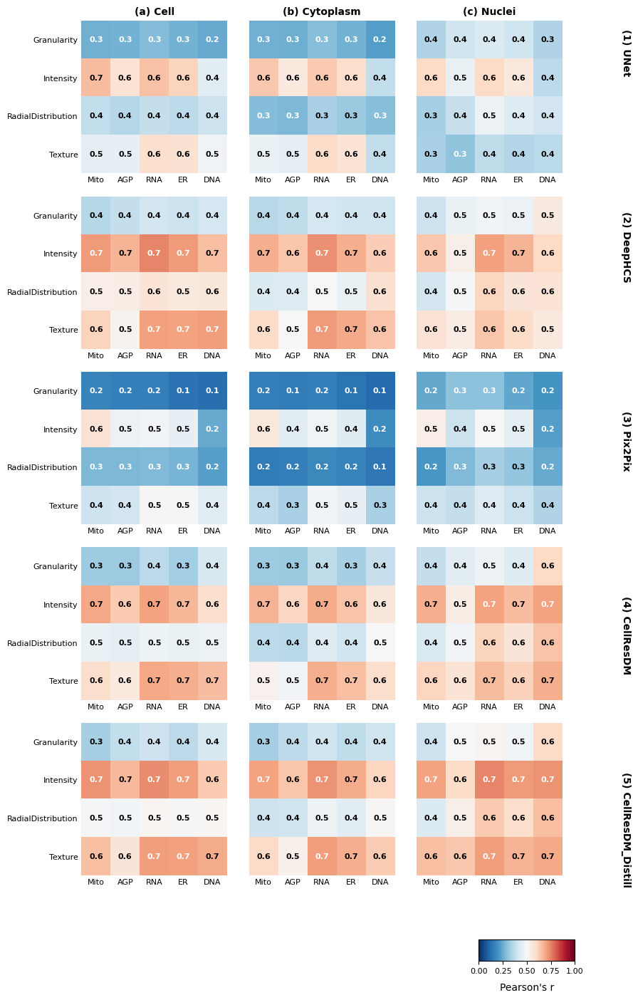

Summary of correlations by method:

UNet:
  Cells: mean correlation = 0.434
  Cytoplasm: mean correlation = 0.401
  Nuclei: mean correlation = 0.413
  Overall mean: 0.416

DeepHCS:
  Cells: mean correlation = 0.572
  Cytoplasm: mean correlation = 0.542
  Nuclei: mean correlation = 0.552
  Overall mean: 0.555

Pix2Pix:
  Cells: mean correlation = 0.327
  Cytoplasm: mean correlation = 0.280
  Nuclei: mean correlation = 0.335
  Overall mean: 0.314

CellResDM:
  Cells: mean correlation = 0.527
  Cytoplasm: mean correlation = 0.494
  Nuclei: mean correlation = 0.574
  Overall mean: 0.532

CellResDM_Distill:
  Cells: mean correlation = 0.558
  Cytoplasm: mean correlation = 0.530
  Nuclei: mean correlation = 0.607
  Overall mean: 0.565


In [ ]:
# Comprehensive heatmap visualization: mimic published figure layout

import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Method mapping to match your actual folder names
method_display_names = {
    'unet': 'UNet',
    'pix2pix': 'Pix2Pix', 
    'deephcs': 'DeepHCS',  # Fixed typo: deephsc -> deephcs
    'rescellDM': 'CellResDM',
    'rescellDM_Distill': 'CellResDM_Distill'
}

# Specify the desired order for the methods
ordered_method_names = ['unet', 'deephcs', 'pix2pix', 'rescellDM', 'rescellDM_Distill']  # Fixed typo: deephsc -> deephcs

num_methods = len(all_correlations)
object_types = ['cells', 'cytoplasm', 'nuclei']
object_titles = ['(a) Cell', '(b) Cytoplasm', '(c) Nuclei']

# Get method names in specified order for consistency
method_names = [name for name in ordered_method_names if name in all_correlations]

# --- Figure layout: 3 columns (object types), one row per method ---
fig_height = 3 * len(method_names)  # compact, but readable
fig, axes = plt.subplots(
    nrows=len(method_names), ncols=3,
    figsize=(9, fig_height),
    gridspec_kw=dict(wspace=0.15, hspace=0.15)
)

# If only one method, axes is 1D, so make it 2D for consistency
if len(method_names) == 1:
    axes = axes.reshape(1, -1)

# --- Draw heatmaps ---
for method_idx, method_name in enumerate(method_names):
    method_correlations = all_correlations[method_name]
    for obj_idx, (obj_type, obj_title) in enumerate(zip(object_types, object_titles)):
        matrix = method_correlations[obj_type]
        ax = axes[method_idx, obj_idx]

        # Heatmap: match color and value range to the example
        im = ax.imshow(matrix, cmap='RdBu_r', vmin=0, vmax=1, aspect='auto')

        # X axis: channel names
        ax.set_xticks(range(len(channels)))
        ax.set_xticklabels(channels, fontsize=8, rotation=0)
        # Y axis: feature categories (only on leftmost column)
        if obj_idx == 0:
            ax.set_yticks(range(len(feature_categories)))
            ax.set_yticklabels(feature_categories, fontsize=8)
        else:
            ax.set_yticks(range(len(feature_categories)))
            ax.set_yticklabels([])

        # Titles: only top row
        if method_idx == 0:
            ax.set_title(obj_title, fontsize=10, fontweight='bold', pad=6)

        # Add correlation values as text, match style
        for i in range(len(feature_categories)):
            for j in range(len(channels)):
                val = matrix[i, j]
                # Use white for dark, black for light backgrounds
                text_color = "white" if val < 0.3 or val > 0.7 else "black"
                ax.text(
                    j, i, f"{val:.1f}",
                    ha="center", va="center",
                    color=text_color, fontsize=8, fontweight='bold'
                )

        # Remove spines and ticks for a clean look
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.tick_params(axis='both', length=0)

# --- Colorbar: positioned at lower right with proper spacing ---
# Create a separate axes for the colorbar in the lower right corner
cax = fig.add_axes([0.75, 0.05, 0.15, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.set_label("Pearson's r", labelpad=8, fontsize=10)
cbar.ax.tick_params(labelsize=8)

# --- Method labels on left, vertically centered for each row ---
for method_idx, method_name in enumerate(method_names):
    y_pos = ((len(method_names) +0.5) - method_idx) / (len(method_names) + 0.5) - 1 / len(method_names) / 2
    print(y_pos)
    display_name = method_display_names.get(method_name, method_name.upper())
    fig.text(
        0.98, y_pos, f'({method_idx + 1}) {display_name}',
        ha='center', va='center', rotation=270,
        fontsize=10, fontweight='bold'
    )

# --- Main caption below the figure, match style ---
fig.subplots_adjust(top=0.93, left=0.13, right=0.88, bottom=0.13)
# fig.suptitle(
#     "Channel-wise Pearson's correlations between morphological features\n"
#     "extracted from different synthetic methods and real features",
#     fontsize=12, y=0.995, fontweight='bold'
# )
# fig.text(
#     0.13, 0.01,
#     "Figure 4: Channel-wise Pearson's correlations between morphological features extracted from different synthetic methods\n"
#     "and real features, aggregated by channel and feature group for cell, cytoplasm, and nuclei objects.",
#     ha='left', va='bottom', fontsize=10, fontweight='normal'
# )

plt.show()

# Print summary statistics for all methods
print("Summary of correlations by method:")
print("="*50)
for method_name in method_names:
    method_correlations = all_correlations[method_name]
    display_name = method_display_names.get(method_name, method_name.upper())
    print(f"\n{display_name}:")
    for obj_type in object_types:
        mean_corr = np.mean(method_correlations[obj_type])
        print(f"  {obj_type.title()}: mean correlation = {mean_corr:.3f}")
    all_obj_correlations = [method_correlations[obj_type] for obj_type in object_types]
    overall_mean = np.mean(all_obj_correlations)
    print(f"  Overall mean: {overall_mean:.3f}")


In [5]:

# Examine the column structure to identify feature categories
sample_columns = real_cells.columns.tolist()

# Define the feature categories based on the image
feature_categories = ['Granularity', 'Intensity', 'RadialDistribution', 'Texture']
channels = ['Mito', 'AGP', 'RNA', 'ER', 'DNA']

# Function to get features for a specific category and channel
def get_features_by_category_channel(df, category, channel):
    """Get all features for a specific category and channel"""
    if category == 'Granularity':
        pattern = f'Granularity_.*_{channel}'
    elif category == 'Intensity':
        pattern = f'Intensity_.*_{channel}'
    elif category == 'RadialDistribution':
        pattern = f'RadialDistribution_.*_{channel}'
    elif category == 'Texture':
        pattern = f'Texture_.*_{channel}'
    
    # Find columns matching the pattern
    matching_cols = [col for col in df.columns if 
                    col.startswith(category) and 
                    col.endswith(f'_{channel}') or 
                    col.endswith(f'{channel}_256') or
                    (category in col and channel in col)]
    
    return matching_cols

# Test the function
print("Sample Granularity features for Mito:")
granularity_mito = get_features_by_category_channel(real_cells, 'Granularity', 'Mito')
print(granularity_mito[:5])  # Show first 5

print("\nSample Intensity features for AGP:")
intensity_agp = get_features_by_category_channel(real_cells, 'Intensity', 'AGP')
print(intensity_agp[:5])  # Show first 5


Sample Granularity features for Mito:
['Granularity_10_Mito', 'Granularity_11_Mito', 'Granularity_12_Mito', 'Granularity_13_Mito', 'Granularity_14_Mito']

Sample Intensity features for AGP:
['Intensity_IntegratedIntensityEdge_AGP', 'Intensity_IntegratedIntensity_AGP', 'Intensity_LowerQuartileIntensity_AGP', 'Intensity_MADIntensity_AGP', 'Intensity_MassDisplacement_AGP']


In [6]:
# Improved function to get features by category and channel
def get_features_by_category_channel(df, category, channel):
    """Get all features for a specific category and channel"""
    matching_cols = []
    
    for col in df.columns:
        if col.startswith(category) and channel in col:
            matching_cols.append(col)
    
    return matching_cols

# Test with all categories and channels
print("Testing feature extraction:")
for category in feature_categories:
    for channel in channels:
        features = get_features_by_category_channel(real_cells, category, channel)
        print(f"{category} - {channel}: {len(features)} features")
        if len(features) > 0:
            print(f"  Sample: {features[0]}")
    print()


Testing feature extraction:
Granularity - Mito: 16 features
  Sample: Granularity_10_Mito
Granularity - AGP: 16 features
  Sample: Granularity_10_AGP
Granularity - RNA: 16 features
  Sample: Granularity_10_RNA
Granularity - ER: 16 features
  Sample: Granularity_10_ER
Granularity - DNA: 16 features
  Sample: Granularity_10_DNA

Intensity - Mito: 15 features
  Sample: Intensity_IntegratedIntensityEdge_Mito
Intensity - AGP: 15 features
  Sample: Intensity_IntegratedIntensityEdge_AGP
Intensity - RNA: 15 features
  Sample: Intensity_IntegratedIntensityEdge_RNA
Intensity - ER: 15 features
  Sample: Intensity_IntegratedIntensityEdge_ER
Intensity - DNA: 15 features
  Sample: Intensity_IntegratedIntensityEdge_DNA

RadialDistribution - Mito: 12 features
  Sample: RadialDistribution_FracAtD_Mito_1of4
RadialDistribution - AGP: 12 features
  Sample: RadialDistribution_FracAtD_AGP_1of4
RadialDistribution - RNA: 12 features
  Sample: RadialDistribution_FracAtD_RNA_1of4
RadialDistribution - ER: 12 fea

In [7]:
df = pd.read_csv("unet/Cells.csv")
df1 = pd.read_csv("real/Cells.csv")

In [8]:
import numpy as np
from scipy.spatial.distance import cdist
from scipy.optimize       import linear_sum_assignment
from scipy.stats          import pearsonr
from tqdm                 import tqdm

# 1) two matchers
def match_by_centroid(real_df, syn_df, max_dist=np.inf):
    coords_r = real_df[['AreaShape_Center_X','AreaShape_Center_Y']].to_numpy()
    coords_s = syn_df [['AreaShape_Center_X','AreaShape_Center_Y']].to_numpy()
    D = cdist(coords_r, coords_s)
    r_idx, s_idx = linear_sum_assignment(D)
    if np.isfinite(max_dist):
        keep = D[r_idx, s_idx] <= max_dist
        r_idx, s_idx = r_idx[keep], s_idx[keep]
    return real_df.iloc[r_idx].reset_index(drop=True), syn_df.iloc[s_idx].reset_index(drop=True)

def match_by_iou(real_df, syn_df, min_iou=0.5):
    boxes = lambda df: df[[
        'AreaShape_BoundingBoxMinimum_Y',
        'AreaShape_BoundingBoxMinimum_X',
        'AreaShape_BoundingBoxMaximum_Y',
        'AreaShape_BoundingBoxMaximum_X'
    ]].to_numpy()
    A, B = boxes(real_df), boxes(syn_df)
    def iou_mat(A,B):
        N, M = len(A), len(B)
        I = np.zeros((N,M))
        for i,(y0a,x0a,y1a,x1a) in enumerate(A):
            for j,(y0b,x0b,y1b,x1b) in enumerate(B):
                ya,xa = max(y0a,y0b), max(x0a,x0b)
                yb,xb = min(y1a,y1b), min(x1a,x1b)
                inter = max(0,yb-ya)*max(0,xb-xa)
                ua = (y1a-y0a)*(x1a-x0a)
                ub = (y1b-y0b)*(x1b-x0b)
                I[i,j] = inter/(ua+ub-inter) if ua+ub-inter>0 else 0
        return I
    I = iou_mat(A,B)
    r_idx, s_idx = linear_sum_assignment(-I)
    keep = I[r_idx, s_idx] >= min_iou
    return (real_df.iloc[r_idx[keep]].reset_index(drop=True),
            syn_df.iloc [s_idx[keep]].reset_index(drop=True))

# 2) updated correlation function
def calculate_aggregated_correlation_matrix(
        real_df,
        synthetic_df,
        matcher='iou',
        max_dist=20,
        min_iou=0.5
    ):
    # match first
    if matcher == 'centroid':
        real_df, synthetic_df = match_by_centroid(real_df, synthetic_df, max_dist)
    elif matcher == 'iou':
        real_df, synthetic_df = match_by_iou   (real_df, synthetic_df, min_iou)
    else:
        raise ValueError("matcher must be 'centroid' or 'iou'")

    matrix = np.zeros((len(feature_categories), len(channels)))
    for i, category in tqdm(enumerate(feature_categories)):
        for j, channel in enumerate(channels):
            feats = get_features_by_category_channel(real_df, category, channel)
            feats = [f for f in feats if f in real_df.columns and f in synthetic_df.columns]
            if not feats:
                matrix[i, j] = np.nan
                continue

            corrs = []
            for feat in feats:
                r = real_df[feat];  s = synthetic_df[feat]
                valid = r.notna() & s.notna()
                if valid.sum() < 2:
                    continue
                corr, _ = pearsonr(r[valid], s[valid])
                if not np.isnan(corr):
                    corrs.append(abs(corr))

            matrix[i, j] = np.mean(corrs) if corrs else np.nan

    return matrix

# 3) main loop
print("Calculating aggregated channel-feature group correlations for all methods...")

all_correlations = {}
for method_name, method_data in synthetic_data.items():
    print(f"Processing {method_name}…")
    method_correlations = {}
    for obj_type in ['cells', 'cytoplasm', 'nuclei']:
        # pick your matcher here:
        matrix = calculate_aggregated_correlation_matrix(
            real_data[obj_type],
            method_data[obj_type],
            matcher='iou',     # or 'centroid'
            max_dist=15,       # only for centroid
            min_iou=0.4        # only for iou
        )
        method_correlations[obj_type] = matrix
    all_correlations[method_name] = method_correlations
    print(f"  {method_name} correlations calculated!")

print(f"\nAggregated correlation matrices calculated for {len(all_correlations)} methods!")
for method in all_correlations:
    print(f"  {method}: {all_correlations[method]['cells'].shape} per object type")


Calculating aggregated channel-feature group correlations for all methods...
Processing deephcs…


4it [00:00,  6.73it/s]
4it [00:02,  1.90it/s]
4it [00:02,  1.55it/s]


  deephcs correlations calculated!
Processing pix2pix…


4it [00:02,  1.48it/s]
4it [00:02,  1.76it/s]
4it [00:02,  1.66it/s]


  pix2pix correlations calculated!
Processing rescellDM…


4it [00:01,  2.33it/s]
4it [00:02,  1.88it/s]
4it [00:02,  1.56it/s]


  rescellDM correlations calculated!
Processing rescellDM_Distill…


4it [00:02,  1.92it/s]
4it [00:01,  2.05it/s]
4it [00:01,  2.16it/s]


  rescellDM_Distill correlations calculated!
Processing unet…


4it [00:03,  1.33it/s]
4it [00:01,  2.35it/s]
4it [00:01,  2.12it/s]

  unet correlations calculated!

Aggregated correlation matrices calculated for 5 methods!
  deephcs: (4, 5) per object type
  pix2pix: (4, 5) per object type
  rescellDM: (4, 5) per object type
  rescellDM_Distill: (4, 5) per object type
  unet: (4, 5) per object type


0.9
0.7181818181818183
0.5363636363636364
0.3545454545454545
0.1727272727272727


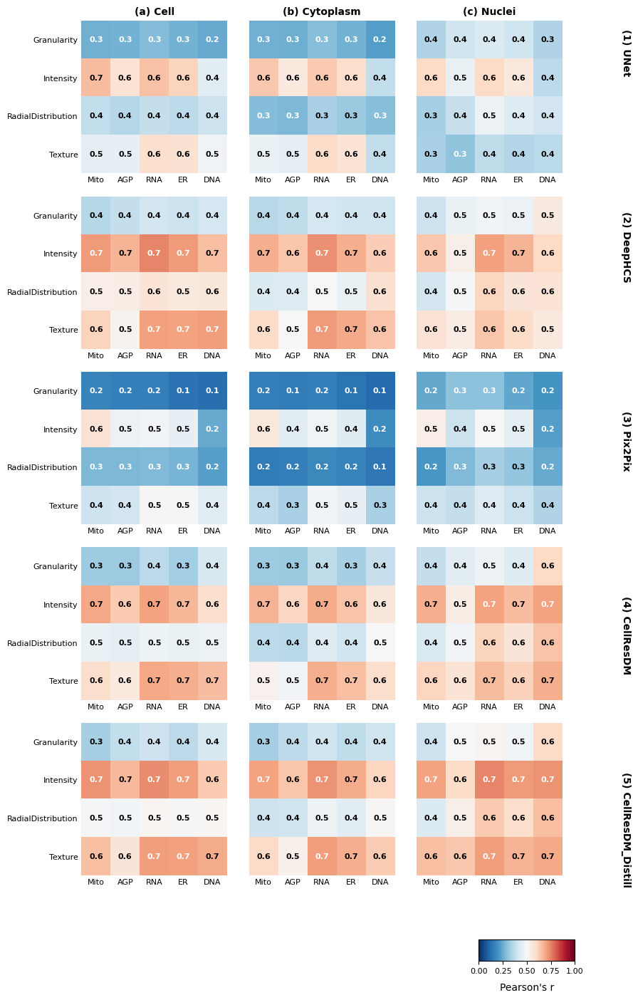

Summary of correlations by method:

UNet:
  Cells: mean correlation = 0.434
  Cytoplasm: mean correlation = 0.401
  Nuclei: mean correlation = 0.413
  Overall mean: 0.416

DeepHCS:
  Cells: mean correlation = 0.572
  Cytoplasm: mean correlation = 0.542
  Nuclei: mean correlation = 0.552
  Overall mean: 0.555

Pix2Pix:
  Cells: mean correlation = 0.327
  Cytoplasm: mean correlation = 0.280
  Nuclei: mean correlation = 0.335
  Overall mean: 0.314

CellResDM:
  Cells: mean correlation = 0.527
  Cytoplasm: mean correlation = 0.494
  Nuclei: mean correlation = 0.574
  Overall mean: 0.532

CellResDM_Distill:
  Cells: mean correlation = 0.558
  Cytoplasm: mean correlation = 0.530
  Nuclei: mean correlation = 0.607
  Overall mean: 0.565


In [9]:
# Comprehensive heatmap visualization: mimic published figure layout

import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Method mapping to match your actual folder names
method_display_names = {
    'unet': 'UNet',
    'pix2pix': 'Pix2Pix', 
    'deephcs': 'DeepHCS',  # Fixed typo: deephsc -> deephcs
    'rescellDM': 'CellResDM',
    'rescellDM_Distill': 'CellResDM_Distill'
}

# Specify the desired order for the methods
ordered_method_names = ['unet', 'deephcs', 'pix2pix', 'rescellDM', 'rescellDM_Distill']  # Fixed typo: deephsc -> deephcs

num_methods = len(all_correlations)
object_types = ['cells', 'cytoplasm', 'nuclei']
object_titles = ['(a) Cell', '(b) Cytoplasm', '(c) Nuclei']

# Get method names in specified order for consistency
method_names = [name for name in ordered_method_names if name in all_correlations]

# --- Figure layout: 3 columns (object types), one row per method ---
fig_height = 3 * len(method_names)  # compact, but readable
fig, axes = plt.subplots(
    nrows=len(method_names), ncols=3,
    figsize=(9, fig_height),
    gridspec_kw=dict(wspace=0.15, hspace=0.15)
)

# If only one method, axes is 1D, so make it 2D for consistency
if len(method_names) == 1:
    axes = axes.reshape(1, -1)

# --- Draw heatmaps ---
for method_idx, method_name in enumerate(method_names):
    method_correlations = all_correlations[method_name]
    for obj_idx, (obj_type, obj_title) in enumerate(zip(object_types, object_titles)):
        matrix = method_correlations[obj_type]
        ax = axes[method_idx, obj_idx]

        # Heatmap: match color and value range to the example
        im = ax.imshow(matrix, cmap='RdBu_r', vmin=0, vmax=1, aspect='auto')

        # X axis: channel names
        ax.set_xticks(range(len(channels)))
        ax.set_xticklabels(channels, fontsize=8, rotation=0)
        # Y axis: feature categories (only on leftmost column)
        if obj_idx == 0:
            ax.set_yticks(range(len(feature_categories)))
            ax.set_yticklabels(feature_categories, fontsize=8)
        else:
            ax.set_yticks(range(len(feature_categories)))
            ax.set_yticklabels([])

        # Titles: only top row
        if method_idx == 0:
            ax.set_title(obj_title, fontsize=10, fontweight='bold', pad=6)

        # Add correlation values as text, match style
        for i in range(len(feature_categories)):
            for j in range(len(channels)):
                val = matrix[i, j]
                # Use white for dark, black for light backgrounds
                text_color = "white" if val < 0.3 or val > 0.7 else "black"
                ax.text(
                    j, i, f"{val:.1f}",
                    ha="center", va="center",
                    color=text_color, fontsize=8, fontweight='bold'
                )

        # Remove spines and ticks for a clean look
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.tick_params(axis='both', length=0)

# --- Colorbar: positioned at lower right with proper spacing ---
# Create a separate axes for the colorbar in the lower right corner
cax = fig.add_axes([0.75, 0.05, 0.15, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
cbar.set_label("Pearson's r", labelpad=8, fontsize=10)
cbar.ax.tick_params(labelsize=8)

# --- Method labels on left, vertically centered for each row ---
for method_idx, method_name in enumerate(method_names):
    y_pos = ((len(method_names) +0.5) - method_idx) / (len(method_names) + 0.5) - 1 / len(method_names) / 2
    print(y_pos)
    display_name = method_display_names.get(method_name, method_name.upper())
    fig.text(
        0.98, y_pos, f'({method_idx + 1}) {display_name}',
        ha='center', va='center', rotation=270,
        fontsize=10, fontweight='bold'
    )

# --- Main caption below the figure, match style ---
fig.subplots_adjust(top=0.93, left=0.13, right=0.88, bottom=0.13)
# fig.suptitle(
#     "Channel-wise Pearson's correlations between morphological features\n"
#     "extracted from different synthetic methods and real features",
#     fontsize=12, y=0.995, fontweight='bold'
# )
# fig.text(
#     0.13, 0.01,
#     "Figure 4: Channel-wise Pearson's correlations between morphological features extracted from different synthetic methods\n"
#     "and real features, aggregated by channel and feature group for cell, cytoplasm, and nuclei objects.",
#     ha='left', va='bottom', fontsize=10, fontweight='normal'
# )

plt.show()

# Print summary statistics for all methods
print("Summary of correlations by method:")
print("="*50)
for method_name in method_names:
    method_correlations = all_correlations[method_name]
    display_name = method_display_names.get(method_name, method_name.upper())
    print(f"\n{display_name}:")
    for obj_type in object_types:
        mean_corr = np.mean(method_correlations[obj_type])
        print(f"  {obj_type.title()}: mean correlation = {mean_corr:.3f}")
    all_obj_correlations = [method_correlations[obj_type] for obj_type in object_types]
    overall_mean = np.mean(all_obj_correlations)
    print(f"  Overall mean: {overall_mean:.3f}")


In [8]:
# Print detailed correlation matrices for all methods
print("Detailed Correlation Results:")
print("="*60)

method_names = sorted(all_correlations.keys())

for method_idx, method_name in enumerate(method_names):
    print(f"\n{method_name.upper()} vs Real:")
    print("Channels:", channels)
    print("Features:", feature_categories)
    print("-" * 50)
    
    method_correlations = all_correlations[method_name]
    
    for obj_type in ['cells', 'cytoplasm', 'nuclei']:
        print(f"\n({obj_type.upper()}):")
        matrix = method_correlations[obj_type]
        
        for i, category in enumerate(feature_categories):
            row_str = f"{category:18}"
            for j, channel in enumerate(channels):
                row_str += f" {matrix[i,j]:5.2f}"
            print(row_str)

# Save all correlation matrices to CSV for further analysis
print(f"\n{'='*60}")
print("Saving results to CSV...")

# Create a comprehensive results summary
results_summary = {
    'Method': [],
    'Object_Type': [],
    'Feature_Category': [],
    'Channel': [],
    'Correlation': []
}

for method_name in method_names:
    method_correlations = all_correlations[method_name]
    
    for obj_type in ['cells', 'cytoplasm', 'nuclei']:
        matrix = method_correlations[obj_type]
        
        for i, category in enumerate(feature_categories):
            for j, channel in enumerate(channels):
                results_summary['Method'].append(method_name)
                results_summary['Object_Type'].append(obj_type.title())
                results_summary['Feature_Category'].append(category)
                results_summary['Channel'].append(channel)
                results_summary['Correlation'].append(matrix[i, j])

results_df = pd.DataFrame(results_summary)

# Save comprehensive results
results_df.to_csv('all_methods_vs_real_correlations.csv', index=False)
print(f"All results saved to 'all_methods_vs_real_correlations.csv'")
print(f"Total correlations calculated: {len(results_df)}")

# Also save individual method files for compatibility
for method_name in method_names:
    method_df = results_df[results_df['Method'] == method_name].copy()
    method_df = method_df.drop('Method', axis=1)  # Remove method column for individual files
    method_df.to_csv(f'{method_name}_vs_real_correlations.csv', index=False)
    print(f"{method_name} results saved to '{method_name}_vs_real_correlations.csv'")

# Create a summary comparison table
print(f"\n{'='*60}")
print("SUMMARY COMPARISON TABLE:")
print(f"{'Method':<12} {'Cells':<8} {'Cytoplasm':<12} {'Nuclei':<8} {'Overall':<8}")
print("-" * 50)

for method_name in method_names:
    method_correlations = all_correlations[method_name]
    cells_mean = np.mean(method_correlations['cells'])
    cyto_mean = np.mean(method_correlations['cytoplasm'])
    nuclei_mean = np.mean(method_correlations['nuclei'])
    overall_mean = np.mean([cells_mean, cyto_mean, nuclei_mean])
    
    print(f"{method_name:<12} {cells_mean:<8.3f} {cyto_mean:<12.3f} {nuclei_mean:<8.3f} {overall_mean:<8.3f}")


Detailed Correlation Results:

DEEPHCS vs Real:
Channels: ['Mito', 'AGP', 'RNA', 'ER', 'DNA']
Features: ['Granularity', 'Intensity', 'RadialDistribution', 'Texture']
--------------------------------------------------

(CELLS):
Granularity         0.36  0.38  0.41  0.39  0.42
Intensity           0.71  0.67  0.75  0.71  0.65
RadialDistribution  0.53  0.54  0.57  0.55  0.56
Texture             0.61  0.52  0.71  0.70  0.71

(CYTOPLASM):
Granularity         0.36  0.37  0.41  0.40  0.40
Intensity           0.68  0.64  0.73  0.68  0.62
RadialDistribution  0.43  0.43  0.50  0.47  0.58
Texture             0.59  0.50  0.71  0.69  0.64

(NUCLEI):
Granularity         0.40  0.47  0.49  0.47  0.54
Intensity           0.64  0.53  0.71  0.67  0.60
RadialDistribution  0.41  0.50  0.61  0.57  0.57
Texture             0.57  0.54  0.64  0.59  0.55

PIX2PIX vs Real:
Channels: ['Mito', 'AGP', 'RNA', 'ER', 'DNA']
Features: ['Granularity', 'Intensity', 'RadialDistribution', 'Texture']
------------------------

In [9]:
import numpy as np
from scipy.spatial.distance import cdist
from scipy.optimize       import linear_sum_assignment
from scipy.stats          import pearsonr
from tqdm                 import tqdm

# 1) two matchers
def match_by_centroid(real_df, syn_df, max_dist=np.inf):
    coords_r = real_df[['AreaShape_Center_X','AreaShape_Center_Y']].to_numpy()
    coords_s = syn_df [['AreaShape_Center_X','AreaShape_Center_Y']].to_numpy()
    D = cdist(coords_r, coords_s)
    r_idx, s_idx = linear_sum_assignment(D)
    if np.isfinite(max_dist):
        keep = D[r_idx, s_idx] <= max_dist
        r_idx, s_idx = r_idx[keep], s_idx[keep]
    return real_df.iloc[r_idx].reset_index(drop=True), syn_df.iloc[s_idx].reset_index(drop=True)

def match_by_iou(real_df, syn_df, min_iou=0.5):
    boxes = lambda df: df[[
        'AreaShape_BoundingBoxMinimum_Y',
        'AreaShape_BoundingBoxMinimum_X',
        'AreaShape_BoundingBoxMaximum_Y',
        'AreaShape_BoundingBoxMaximum_X'
    ]].to_numpy()
    A, B = boxes(real_df), boxes(syn_df)
    def iou_mat(A,B):
        N, M = len(A), len(B)
        I = np.zeros((N,M))
        for i,(y0a,x0a,y1a,x1a) in enumerate(A):
            for j,(y0b,x0b,y1b,x1b) in enumerate(B):
                ya,xa = max(y0a,y0b), max(x0a,x0b)
                yb,xb = min(y1a,y1b), min(x1a,x1b)
                inter = max(0,yb-ya)*max(0,xb-xa)
                ua = (y1a-y0a)*(x1a-x0a)
                ub = (y1b-y0b)*(x1b-x0b)
                I[i,j] = inter/(ua+ub-inter) if ua+ub-inter>0 else 0
        return I
    I = iou_mat(A,B)
    r_idx, s_idx = linear_sum_assignment(-I)
    keep = I[r_idx, s_idx] >= min_iou
    return (real_df.iloc[r_idx[keep]].reset_index(drop=True),
            syn_df.iloc [s_idx[keep]].reset_index(drop=True))

# 2) updated correlation function
def calculate_aggregated_correlation_matrix(
        real_df,
        synthetic_df,
        matcher='centroid',
        max_dist=20,
        min_iou=0.5
    ):
    # match first
    if matcher == 'centroid':
        real_df, synthetic_df = match_by_centroid(real_df, synthetic_df, max_dist)
    elif matcher == 'iou':
        real_df, synthetic_df = match_by_iou   (real_df, synthetic_df, min_iou)
    else:
        raise ValueError("matcher must be 'centroid' or 'iou'")

    matrix = np.zeros((len(feature_categories), len(channels)))
    for i, category in tqdm(enumerate(feature_categories)):
        for j, channel in enumerate(channels):
            feats = get_features_by_category_channel(real_df, category, channel)
            feats = [f for f in feats if f in real_df.columns and f in synthetic_df.columns]
            if not feats:
                matrix[i, j] = np.nan
                continue

            corrs = []
            for feat in feats:
                r = real_df[feat];  s = synthetic_df[feat]
                valid = r.notna() & s.notna()
                if valid.sum() < 2:
                    continue
                corr, _ = pearsonr(r[valid], s[valid])
                if not np.isnan(corr):
                    corrs.append(abs(corr))

            matrix[i, j] = np.mean(corrs) if corrs else np.nan

    return matrix

# 3) main loop
print("Calculating aggregated channel-feature group correlations for all methods...")

all_correlations = {}
for method_name, method_data in synthetic_data.items():
    print(f"Processing {method_name}…")
    method_correlations = {}
    for obj_type in ['cells', 'cytoplasm', 'nuclei']:
        # pick your matcher here:
        matrix = calculate_aggregated_correlation_matrix(
            real_data[obj_type],
            method_data[obj_type],
            matcher='iou',     # or 'centroid'
            max_dist=15,       # only for centroid
            min_iou=0.4        # only for iou
        )
        method_correlations[obj_type] = matrix
    all_correlations[method_name] = method_correlations
    print(f"  {method_name} correlations calculated!")

print(f"\nAggregated correlation matrices calculated for {len(all_correlations)} methods!")
for method in all_correlations:
    print(f"  {method}: {all_correlations[method]['cells'].shape} per object type")


Calculating aggregated channel-feature group correlations for all methods...
Processing deephcs…


4it [00:00,  5.53it/s]
4it [00:00,  4.99it/s]
4it [00:00,  7.10it/s]


  deephcs correlations calculated!
Processing pix2pix…


4it [00:00,  6.06it/s]
4it [00:00,  4.60it/s]
4it [00:01,  3.75it/s]


  pix2pix correlations calculated!
Processing rescellDM…


4it [00:01,  2.74it/s]
4it [00:02,  1.46it/s]
4it [00:01,  3.33it/s]


  rescellDM correlations calculated!
Processing rescellDM_Distill…


4it [00:00,  4.25it/s]
4it [00:03,  1.05it/s]
4it [00:00,  5.29it/s]


  rescellDM_Distill correlations calculated!
Processing unet…


4it [00:00,  5.68it/s]
4it [00:02,  1.42it/s]
4it [00:01,  2.70it/s]

  unet correlations calculated!

Aggregated correlation matrices calculated for 5 methods!
  deephcs: (4, 5) per object type
  pix2pix: (4, 5) per object type
  rescellDM: (4, 5) per object type
  rescellDM_Distill: (4, 5) per object type
  unet: (4, 5) per object type


In [10]:
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
from PIL import Image
import pandas as pd

# Function to load TIFF images and get statistics
def load_and_analyze_tiff(filepath):
    """Load a TIFF image and return the array with statistics"""
    try:
        img = Image.open(filepath)
        img_array = np.array(img)
        stats = {
            'min': np.min(img_array),
            'max': np.max(img_array),
            'mean': np.mean(img_array),
            'std': np.std(img_array),
            'shape': img_array.shape
        }
        return img_array, stats
    except Exception as e:
        print(f"Error loading {filepath}: {e}")
        return None, None

# Define the available methods and channels
input_base_dir = "../cell_profiler_input"
channels = ["DNA", "ER", "AGP", "Mito", "RNA"]

# Find all available method folders
method_folders = []
for item in os.listdir(input_base_dir):
    item_path = os.path.join(input_base_dir, item)
    if os.path.isdir(item_path) and item.endswith("_tiff"):
        method_name = item.replace("_tiff", "")
        method_folders.append((method_name, item_path))

print(f"Found {len(method_folders)} method folders:")
for method_name, folder_path in method_folders:
    print(f"  - {method_name}: {folder_path}")

# Select the first available image from each method for visualization
selected_images = {}
image_stats = {}

for method_name, folder_path in method_folders:
    images_dir = os.path.join(folder_path, "images")
    if not os.path.exists(images_dir):
        print(f"No images directory found for {method_name}")
        continue
    
    # Find the first complete set of channel images (same r##c##f##)
    tiff_files = glob.glob(os.path.join(images_dir, "*.tif"))
    
    # Extract unique image identifiers (r##c##f##)
    image_ids = set()
    for tiff_file in tiff_files:
        basename = os.path.basename(tiff_file)
        # Extract r##c##f## pattern
        import re
        match = re.search(r'(r\d{2}c\d{2}f\d{2})', basename)
        if match:
            image_ids.add(match.group(1))
    
    if image_ids:
        # Use the first image ID
        selected_id = sorted(list(image_ids))[0]
        print(f"\nSelected image ID for {method_name}: {selected_id}")
        
        # Load all channels for this image
        method_images = {}
        method_stats = {}
        
        for channel in channels:
            channel_file = os.path.join(images_dir, f"{selected_id}_pred_{channel}.tif")
            if os.path.exists(channel_file):
                img_array, stats = load_and_analyze_tiff(channel_file)
                if img_array is not None:
                    method_images[channel] = img_array
                    method_stats[channel] = stats
                    print(f"  {channel}: {stats['shape']}, min={stats['min']}, max={stats['max']}, mean={stats['mean']:.2f}")
                else:
                    print(f"  {channel}: Failed to load")
            else:
                print(f"  {channel}: File not found - {channel_file}")
        
        if method_images:
            selected_images[method_name] = method_images
            image_stats[method_name] = method_stats

print(f"\nSuccessfully loaded images for {len(selected_images)} methods: {list(selected_images.keys())}")


Found 6 method folders:
  - deephcs: ../cell_profiler_input\deephcs_tiff
  - pix2pix: ../cell_profiler_input\pix2pix_tiff
  - real: ../cell_profiler_input\real_tiff
  - rescelldm_2step: ../cell_profiler_input\rescelldm_2step_tiff
  - rescelldm: ../cell_profiler_input\rescelldm_tiff
  - unet: ../cell_profiler_input\unet_tiff

Selected image ID for deephcs: r01c01f01


  DNA: (512, 512), min=0.0, max=1.0, mean=0.10
  ER: (512, 512), min=0.0, max=1.0, mean=0.23
  AGP: (512, 512), min=0.0, max=1.0, mean=0.26
  Mito: (512, 512), min=0.0, max=1.0, mean=0.30
  RNA: (512, 512), min=0.0, max=1.0, mean=0.24

Selected image ID for pix2pix: r01c01f01
  DNA: (512, 512), min=0.0, max=1.0, mean=0.25
  ER: (512, 512), min=0.0, max=1.0, mean=0.36
  AGP: (512, 512), min=0.0, max=1.0, mean=0.37
  Mito: (512, 512), min=0.0, max=1.0, mean=0.39
  RNA: (512, 512), min=0.0, max=1.0, mean=0.30

Selected image ID for real: r01c01f01
  DNA: (512, 512), min=0.0, max=1.0, mean=0.12
  ER: (512, 512), min=0.0, max=1.0, mean=0.24
  AGP: (512, 512), min=0.0, max=1.0, mean=0.28
  Mito: (512, 512), min=0.0, max=1.0, mean=0.32
  RNA: (512, 512), min=0.0, max=1.0, mean=0.27

Selected image ID for rescelldm_2step: r01c01f01
  DNA: (512, 512), min=0.0, max=1.0, mean=0.12
  ER: (512, 512), min=0.0, max=1.0, mean=0.25
  AGP: (512, 512), min=0.0, max=1.0, mean=0.27
  Mito: (512, 512), min=

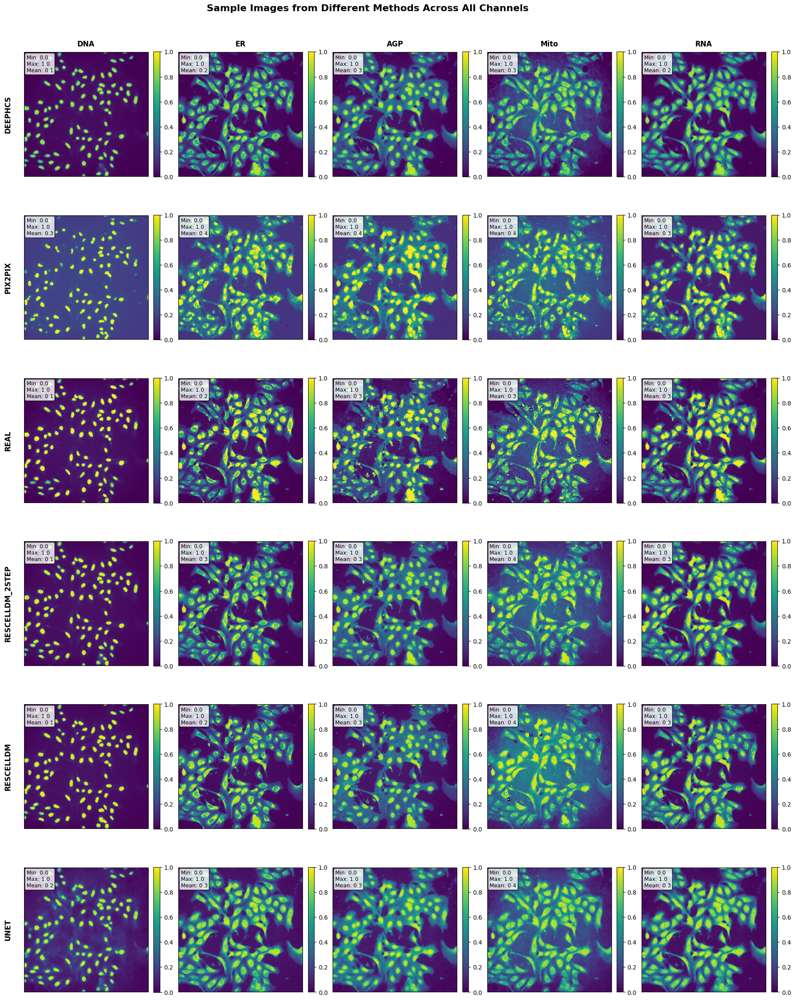


SUMMARY STATISTICS TABLE
         Method Channel  Min  Max     Mean      Std   Shape
        deephcs     DNA  0.0  1.0 0.100775 0.215997 512×512
        deephcs      ER  0.0  1.0 0.233945 0.264348 512×512
        deephcs     AGP  0.0  1.0 0.256488 0.252388 512×512
        deephcs    Mito  0.0  1.0 0.295201 0.244669 512×512
        deephcs     RNA  0.0  1.0 0.242851 0.269007 512×512
        pix2pix     DNA  0.0  1.0 0.253384 0.182684 512×512
        pix2pix      ER  0.0  1.0 0.362391 0.250849 512×512
        pix2pix     AGP  0.0  1.0 0.367742 0.255027 512×512
        pix2pix    Mito  0.0  1.0 0.389294 0.224033 512×512
        pix2pix     RNA  0.0  1.0 0.301131 0.280524 512×512
           real     DNA  0.0  1.0 0.120973 0.247136 512×512
           real      ER  0.0  1.0 0.244613 0.290504 512×512
           real     AGP  0.0  1.0 0.281769 0.278945 512×512
           real    Mito  0.0  1.0 0.318565 0.271570 512×512
           real     RNA  0.0  1.0 0.265157 0.300227 512×512
rescelldm_2ste

In [11]:
# Create comprehensive visualization of all methods and channels
methods_list = list(selected_images.keys())
num_methods = len(methods_list)
num_channels = len(channels)

if num_methods > 0:
    # Create a large figure with subplots: methods × channels
    fig, axes = plt.subplots(num_methods, num_channels, figsize=(20, 4*num_methods))
    
    # Handle case where there's only one method
    if num_methods == 1:
        axes = axes.reshape(1, -1)
    
    # Plot images for each method and channel
    for method_idx, method_name in enumerate(methods_list):
        for channel_idx, channel in enumerate(channels):
            ax = axes[method_idx, channel_idx] if num_methods > 1 else axes[channel_idx]
            
            if channel in selected_images[method_name]:
                img_array = selected_images[method_name][channel]
                stats = image_stats[method_name][channel]
                
                # Display the image
                im = ax.imshow(img_array, cmap='viridis', aspect='equal')
                
                # Set title with method and channel info
                if method_idx == 0:  # Only show channel name on top row
                    ax.set_title(f'{channel}', fontsize=12, fontweight='bold', pad=10)
                
                # Add statistics as text overlay
                ax.text(0.02, 0.98, f'Min: {stats["min"]}\nMax: {stats["max"]}\nMean: {stats["mean"]:.1f}', 
                       transform=ax.transAxes, fontsize=9, verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
                
                # Add colorbar for each image
                plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            else:
                # If channel not available, show empty plot with message
                ax.text(0.5, 0.5, f'No {channel}\ndata available', 
                       transform=ax.transAxes, ha='center', va='center',
                       fontsize=12, style='italic')
                ax.set_facecolor('lightgray')
            
            # Remove axis ticks for cleaner look
            ax.set_xticks([])
            ax.set_yticks([])
            
            # Add method label on the left for first channel
            if channel_idx == 0:
                ax.set_ylabel(f'{method_name.upper()}', fontsize=12, fontweight='bold', rotation=90, labelpad=20)
    
    # Add main title
    plt.suptitle('Sample Images from Different Methods Across All Channels', 
                 fontsize=16, fontweight='bold', y=0.98)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.1)
    plt.show()
    
else:
    print("No images were successfully loaded for visualization.")

# Create a summary statistics table
print("\n" + "="*80)
print("SUMMARY STATISTICS TABLE")
print("="*80)

if selected_images:
    # Create a comprehensive statistics DataFrame
    stats_data = []
    
    for method_name in methods_list:
        for channel in channels:
            if channel in image_stats[method_name]:
                stats = image_stats[method_name][channel]
                stats_data.append({
                    'Method': method_name,
                    'Channel': channel,
                    'Min': stats['min'],
                    'Max': stats['max'],
                    'Mean': stats['mean'],
                    'Std': stats['std'],
                    'Shape': f"{stats['shape'][0]}×{stats['shape'][1]}"
                })
    
    stats_df = pd.DataFrame(stats_data)
    print(stats_df.to_string(index=False))
    
    # Save statistics to CSV
    stats_df.to_csv('image_statistics_summary.csv', index=False)
    print(f"\nStatistics saved to 'image_statistics_summary.csv'")
    
    # Print channel-wise comparison across methods
    print(f"\n{'='*80}")
    print("CHANNEL-WISE COMPARISON ACROSS METHODS")
    print("="*80)
    
    for channel in channels:
        print(f"\n{channel} Channel:")
        print(f"{'Method':<20} {'Min':<8} {'Max':<8} {'Mean':<10} {'Std':<10}")
        print("-" * 60)
        
        for method_name in methods_list:
            if channel in image_stats[method_name]:
                stats = image_stats[method_name][channel]
                print(f"{method_name:<20} {stats['min']:<8} {stats['max']:<8} {stats['mean']:<10.1f} {stats['std']:<10.1f}")
            else:
                print(f"{method_name:<20} {'N/A':<8} {'N/A':<8} {'N/A':<10} {'N/A':<10}")

else:
    print("No statistics available - no images were loaded.")


In [12]:
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import pandas as pd

# Function to load NPY files and get statistics
def load_and_analyze_npy(filepath):
    """Load a NPY image and return the array with statistics"""
    try:
        img_array = np.load(filepath)
        
        # If channels are first (5, H, W), move them to last axis → (H, W, 5)
        if img_array.shape[0] == 5 and img_array.ndim == 3:
            img_array = np.moveaxis(img_array, 0, -1)
            
        # Get statistics for each channel
        channel_stats = []
        for i in range(img_array.shape[-1]):
            channel_data = img_array[..., i]
            stats = {
                'min': float(np.min(channel_data)),
                'max': float(np.max(channel_data)),
                'mean': float(np.mean(channel_data)),
                'std': float(np.std(channel_data)),
                'shape': channel_data.shape
            }
            channel_stats.append(stats)
        
        return img_array, channel_stats
    except Exception as e:
        print(f"Error loading {filepath}: {e}")
        return None, None

# Define the available methods and channels
original_files_dir = "../cell_profiler_original_files"
channels = ["DNA", "ER", "AGP", "Mito", "RNA"]

# Find all available method folders
method_folders = []
for item in os.listdir(original_files_dir):
    item_path = os.path.join(original_files_dir, item)
    if os.path.isdir(item_path) and not item.startswith('.'):
        method_folders.append((item, item_path))

print(f"Found {len(method_folders)} method folders:")
for method_name, folder_path in method_folders:
    print(f"  - {method_name}: {folder_path}")

# Select the first available image from each method for visualization
selected_images = {}
image_stats = {}

for method_name, folder_path in method_folders:
    # Find all NPY files in this method folder
    npy_files = glob.glob(os.path.join(folder_path, "*.npy"))
    
    if npy_files:
        # Use the first NPY file (sorted alphabetically)
        selected_file = sorted(npy_files)[0]
        print(f"\nSelected NPY file for {method_name}: {os.path.basename(selected_file)}")
        
        # Load the NPY file
        img_array, channel_stats = load_and_analyze_npy(selected_file)
        
        if img_array is not None:
            selected_images[method_name] = img_array
            image_stats[method_name] = {}
            
            # Print statistics for each channel
            for i, channel in enumerate(channels):
                stats = channel_stats[i]
                image_stats[method_name][channel] = stats
                print(f"  {channel}: {stats['shape']}, min={stats['min']}, max={stats['max']}, mean={stats['mean']:.2f}")
    else:
        print(f"No NPY files found for {method_name}")

print(f"\nSuccessfully loaded images for {len(selected_images)} methods: {list(selected_images.keys())}")


Found 6 method folders:
  - deephcs: ../cell_profiler_original_files\deephcs
  - pix2pix: ../cell_profiler_original_files\pix2pix
  - real: ../cell_profiler_original_files\real
  - rescelldm: ../cell_profiler_original_files\rescelldm
  - rescelldm_2step: ../cell_profiler_original_files\rescelldm_2step
  - unet: ../cell_profiler_original_files\unet

Selected NPY file for deephcs: r01c01f01p01_pred.npy
  DNA: (512, 512), min=0.0, max=1.1235613822937012, mean=0.33
  ER: (512, 512), min=0.0, max=1.1153781414031982, mean=0.29
  AGP: (512, 512), min=0.0, max=1.1449402570724487, mean=0.28
  Mito: (512, 512), min=0.0, max=1.1138800382614136, mean=0.26
  RNA: (512, 512), min=0.0, max=1.1355247497558594, mean=0.11

Selected NPY file for pix2pix: r01c01f01p01_pred.npy
  DNA: (512, 512), min=-0.19001805782318115, max=1.0, mean=0.27
  ER: (512, 512), min=-0.1535027176141739, max=1.0, mean=0.27
  AGP: (512, 512), min=-0.06685556471347809, max=0.9999999403953552, mean=0.25
  Mito: (512, 512), min=-0.

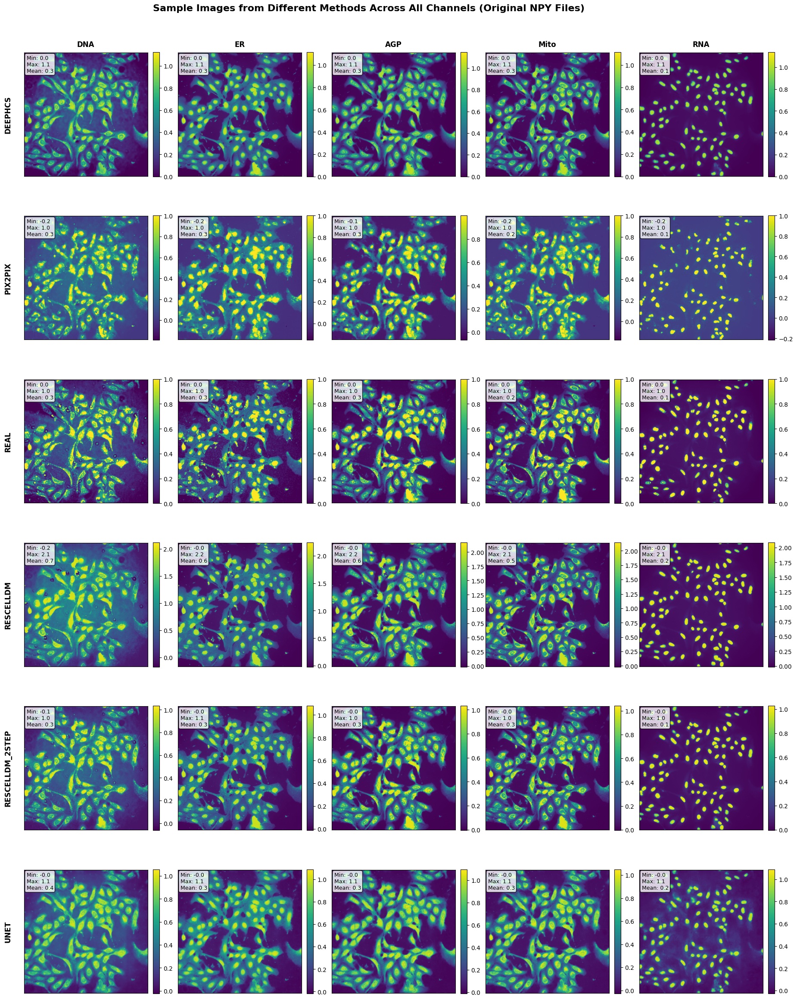

In [13]:
# Create comprehensive visualization of all methods and channels from NPY files
methods_list = list(selected_images.keys())
num_methods = len(methods_list)
num_channels = len(channels)

if num_methods > 0:
    # Create a large figure with subplots: methods × channels
    fig, axes = plt.subplots(num_methods, num_channels, figsize=(20, 4*num_methods))
    
    # Handle case where there's only one method
    if num_methods == 1:
        axes = axes.reshape(1, -1)
    
    # Plot images for each method and channel
    for method_idx, method_name in enumerate(methods_list):
        img_array = selected_images[method_name]
        
        for channel_idx, channel in enumerate(channels):
            ax = axes[method_idx, channel_idx]
            
            # Extract the channel data
            channel_data = img_array[..., channel_idx]
            stats = image_stats[method_name][channel]
            
            # Normalize for better visualization (0-1 range)
            vmin = stats['min']
            vmax = stats['max']
            
            # Display the image
            im = ax.imshow(channel_data, cmap='viridis', aspect='equal', vmin=vmin, vmax=vmax)
            
            # Set title with method and channel info
            if method_idx == 0:  # Only show channel name on top row
                ax.set_title(f'{channel}', fontsize=12, fontweight='bold', pad=10)
            
            # Add statistics as text overlay
            ax.text(0.02, 0.98, f'Min: {stats["min"]:.1f}\nMax: {stats["max"]:.1f}\nMean: {stats["mean"]:.1f}', 
                   transform=ax.transAxes, fontsize=9, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            # Add colorbar for each image
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            
            # Remove axis ticks for cleaner look
            ax.set_xticks([])
            ax.set_yticks([])
            
            # Add method label on the left for first channel
            if channel_idx == 0:
                ax.set_ylabel(f'{method_name.upper()}', fontsize=12, fontweight='bold', rotation=90, labelpad=20)
    
    # Add main title
    plt.suptitle('Sample Images from Different Methods Across All Channels (Original NPY Files)', 
                 fontsize=16, fontweight='bold', y=0.98)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.1)
    plt.show()
    
else:
    print("No images were successfully loaded for visualization.")


In [14]:
# Create a summary statistics table for the NPY files
print("\n" + "="*80)
print("SUMMARY STATISTICS TABLE FOR ORIGINAL NPY FILES")
print("="*80)

if selected_images:
    # Create a comprehensive statistics DataFrame
    stats_data = []
    
    for method_name in methods_list:
        for channel_idx, channel in enumerate(channels):
            if channel in image_stats[method_name]:
                stats = image_stats[method_name][channel]
                stats_data.append({
                    'Method': method_name,
                    'Channel': channel,
                    'Min': stats['min'],
                    'Max': stats['max'],
                    'Mean': stats['mean'],
                    'Std': stats['std'],
                    'Shape': f"{stats['shape'][0]}×{stats['shape'][1]}"
                })
    
    stats_df = pd.DataFrame(stats_data)
    print(stats_df.to_string(index=False))
    
    # Save statistics to CSV
    stats_df.to_csv('npy_image_statistics_summary.csv', index=False)
    print(f"\nStatistics saved to 'npy_image_statistics_summary.csv'")
    
    # Print channel-wise comparison across methods
    print(f"\n{'='*80}")
    print("CHANNEL-WISE COMPARISON ACROSS METHODS")
    print("="*80)
    
    for channel_idx, channel in enumerate(channels):
        print(f"\n{channel} Channel:")
        print(f"{'Method':<20} {'Min':<10} {'Max':<10} {'Mean':<10} {'Std':<10}")
        print("-" * 60)
        
        for method_name in methods_list:
            if channel in image_stats[method_name]:
                stats = image_stats[method_name][channel]
                print(f"{method_name:<20} {stats['min']:<10.2f} {stats['max']:<10.2f} {stats['mean']:<10.2f} {stats['std']:<10.2f}")
            else:
                print(f"{method_name:<20} {'N/A':<10} {'N/A':<10} {'N/A':<10} {'N/A':<10}")
else:
    print("No statistics available - no images were loaded.")



SUMMARY STATISTICS TABLE FOR ORIGINAL NPY FILES
         Method Channel       Min      Max     Mean      Std   Shape
        deephcs     DNA  0.000000 1.123561 0.331677 0.274901 512×512
        deephcs      ER  0.000000 1.115378 0.286081 0.281508 512×512
        deephcs     AGP  0.000000 1.144940 0.278050 0.307997 512×512
        deephcs    Mito  0.000000 1.113880 0.260586 0.294452 512×512
        deephcs     RNA  0.000000 1.135525 0.114432 0.245270 512×512
        pix2pix     DNA -0.190018 1.000000 0.273249 0.266603 512×512
        pix2pix      ER -0.153503 1.000000 0.270688 0.294174 512×512
        pix2pix     AGP -0.066856 1.000000 0.254408 0.299279 512×512
        pix2pix    Mito -0.176538 1.000000 0.249829 0.295134 512×512
        pix2pix     RNA -0.216229 1.000000 0.091944 0.222186 512×512
           real     DNA  0.000000 1.000000 0.318565 0.271570 512×512
           real      ER  0.000000 1.000000 0.281769 0.278945 512×512
           real     AGP  0.000000 1.000000 0.265157 0.

In [15]:
# CORRECTED correlation function with proper object matching
def calculate_correlation_matrix_matched(real_df, synthetic_df, object_type, matching_columns=['ImageNumber', 'ObjectNumber']):
    """Calculate correlation matrix with proper object matching"""
    
    correlation_matrix = np.zeros((len(feature_categories), len(channels)))
    
    print(f"Processing {object_type}...")
    print(f"Real data shape: {real_df.shape}, Synthetic data shape: {synthetic_df.shape}")
    
    # Find common objects between real and synthetic data
    if all(col in real_df.columns and col in synthetic_df.columns for col in matching_columns):
        # Merge on matching columns to ensure we're comparing the same objects
        merged_data = pd.merge(
            real_df, 
            synthetic_df, 
            on=matching_columns, 
            suffixes=('_real', '_synthetic'),
            how='inner'
        )
        print(f"Matched objects: {len(merged_data)}")
        
        if len(merged_data) == 0:
            print(f"Warning: No matching objects found for {object_type}")
            return correlation_matrix
            
    else:
        print(f"Warning: Matching columns {matching_columns} not found, using direct comparison")
        # Fallback to direct comparison (less accurate)
        min_length = min(len(real_df), len(synthetic_df))
        merged_data = pd.concat([
            real_df.iloc[:min_length].reset_index(drop=True),
            synthetic_df.iloc[:min_length].reset_index(drop=True)
        ], axis=1, suffixes=('_real', '_synthetic'))
    
    for i, category in enumerate(feature_categories):
        for j, channel in enumerate(channels):
            # Get features for this category and channel
            features = get_features_by_category_channel(real_df, category, channel)
            
            if len(features) == 0:
                correlation_matrix[i, j] = 0
                continue
            
            # Calculate correlations for all features in this category-channel combination
            correlations = []
            
            for feature in features:
                real_feature = f"{feature}_real"
                synthetic_feature = f"{feature}_synthetic"
                
                if real_feature in merged_data.columns and synthetic_feature in merged_data.columns:
                    # Get the matched data
                    real_values = merged_data[real_feature].dropna()
                    synthetic_values = merged_data[synthetic_feature].dropna()
                    
                    # Make sure we have the same indices
                    common_indices = real_values.index.intersection(synthetic_values.index)
                    
                    if len(common_indices) > 1:
                        real_vals = real_values.loc[common_indices]
                        synth_vals = synthetic_values.loc[common_indices]
                        
                        # Calculate Pearson correlation
                        try:
                            corr, _ = pearsonr(real_vals, synth_vals)
                            if not np.isnan(corr):
                                correlations.append(abs(corr))  # Use absolute correlation
                        except:
                            continue
            
            # Take the mean correlation for this category-channel combination
            if len(correlations) > 0:
                correlation_matrix[i, j] = np.mean(correlations)
                print(f"  {category}-{channel}: {len(correlations)} features, mean corr: {correlation_matrix[i, j]:.3f}")
            else:
                correlation_matrix[i, j] = 0
    
    return correlation_matrix

# Calculate CORRECTED correlation matrices for all synthetic methods
print("\nCalculating CORRECTED correlations with proper object matching...")

# Dictionary to store all CORRECTED correlation results
all_correlations_corrected = {}

for method_name, method_data in synthetic_data.items():
    print(f"\nProcessing {method_name}...")
    
    method_correlations = {}
    for obj_type in ['cells', 'cytoplasm', 'nuclei']:
        correlation_matrix = calculate_correlation_matrix_matched(
            real_data[obj_type], 
            method_data[obj_type], 
            obj_type.title()
        )
        method_correlations[obj_type] = correlation_matrix
    
    all_correlations_corrected[method_name] = method_correlations
    print(f"  {method_name} correlations calculated!")

print(f"\nCORRECTED correlation matrices calculated for {len(all_correlations_corrected)} methods!")
for method in all_correlations_corrected.keys():
    print(f"  {method}: {all_correlations_corrected[method]['cells'].shape} per object type")



Calculating CORRECTED correlations with proper object matching...

Processing deephcs...
Processing Cells...
Real data shape: (4279, 1182), Synthetic data shape: (4244, 1182)


Matched objects: 4213
  Granularity-DNA: 16 features, mean corr: 0.218
  Granularity-ER: 16 features, mean corr: 0.212
  Granularity-AGP: 16 features, mean corr: 0.234
  Granularity-Mito: 16 features, mean corr: 0.199
  Granularity-RNA: 16 features, mean corr: 0.224
  Intensity-DNA: 15 features, mean corr: 0.439
  Intensity-ER: 15 features, mean corr: 0.370
  Intensity-AGP: 15 features, mean corr: 0.335
  Intensity-Mito: 15 features, mean corr: 0.379
  Intensity-RNA: 15 features, mean corr: 0.391
  RadialDistribution-DNA: 12 features, mean corr: 0.261
  RadialDistribution-ER: 12 features, mean corr: 0.261
  RadialDistribution-AGP: 12 features, mean corr: 0.254
  RadialDistribution-Mito: 12 features, mean corr: 0.262
  RadialDistribution-RNA: 12 features, mean corr: 0.280
  Texture-DNA: 156 features, mean corr: 0.352
  Texture-ER: 156 features, mean corr: 0.365
  Texture-AGP: 156 features, mean corr: 0.258
  Texture-Mito: 156 features, mean corr: 0.302
  Texture-RNA: 156 features, mean 

In [16]:
# Save CORRECTED results to CSV files
print("\nSaving CORRECTED correlation results...")

# Save individual method correlations (using actual method names)
for method_name in method_names:
    filename = f"{method_name}_vs_real_correlations_CORRECTED.csv"
    
    # Create a detailed correlation dataframe
    correlation_records = []
    
    for obj_type in object_types:
        correlation_matrix = all_correlations_corrected[method_name][obj_type]
        
        for i, category in enumerate(feature_categories):
            for j, channel in enumerate(channels):
                correlation_records.append({
                    'Method': method_name,
                    'Object_Type': obj_type.title(),
                    'Feature_Category': category,
                    'Channel': channel,
                    'Correlation': correlation_matrix[i, j]
                })
    
    correlation_df = pd.DataFrame(correlation_records)
    correlation_df.to_csv(filename, index=False)
    print(f"  Saved {filename}")

# Save comprehensive results for all methods
all_records_corrected = []
for method_name in method_names:
    for obj_type in object_types:
        correlation_matrix = all_correlations_corrected[method_name][obj_type]
        
        for i, category in enumerate(feature_categories):
            for j, channel in enumerate(channels):
                all_records_corrected.append({
                    'Method': method_name,
                    'Object_Type': obj_type.title(),
                    'Feature_Category': category,
                    'Channel': channel,
                    'Correlation': correlation_matrix[i, j]
                })

all_correlations_df_corrected = pd.DataFrame(all_records_corrected)
all_correlations_df_corrected.to_csv('all_methods_vs_real_correlations_CORRECTED.csv', index=False)
print("  Saved all_methods_vs_real_correlations_CORRECTED.csv")

print("\nCORRECTED files saved with proper object matching and actual method names!")
print(f"Total data points: {len(all_correlations_df_corrected)}")
print(f"Methods included: {method_names}")

# Show a sample of the corrected results
print("\nSample of CORRECTED correlation data:")
print(all_correlations_df_corrected.head(10).to_string(index=False))



Saving CORRECTED correlation results...
  Saved deephcs_vs_real_correlations_CORRECTED.csv
  Saved pix2pix_vs_real_correlations_CORRECTED.csv
  Saved rescellDM_vs_real_correlations_CORRECTED.csv
  Saved rescellDM_Distill_vs_real_correlations_CORRECTED.csv
  Saved unet_vs_real_correlations_CORRECTED.csv
  Saved all_methods_vs_real_correlations_CORRECTED.csv

CORRECTED files saved with proper object matching and actual method names!
Total data points: 300
Methods included: ['deephcs', 'pix2pix', 'rescellDM', 'rescellDM_Distill', 'unet']

Sample of CORRECTED correlation data:
 Method Object_Type Feature_Category Channel  Correlation
deephcs       Cells      Granularity     DNA     0.217927
deephcs       Cells      Granularity      ER     0.212367
deephcs       Cells      Granularity     AGP     0.233595
deephcs       Cells      Granularity    Mito     0.198558
deephcs       Cells      Granularity     RNA     0.224232
deephcs       Cells        Intensity     DNA     0.439139
deephcs      

In [17]:
# FIGURE 5 ANALYSIS: Morphological Feature Types (Correlation, Location, Neighbors, Number, Parent)
print("="*80)
print("FIGURE 5 ANALYSIS: MORPHOLOGICAL FEATURE TYPES")
print("="*80)

# Define the morphological feature types from Figure 5
morphological_feature_types = ['Correlation', 'Location', 'Neighbors', 'Number', 'Parent']

def get_features_by_morphological_type(df, feature_type):
    """Extract features based on morphological feature type (matching Figure 5)"""
    features = []
    
    if feature_type == 'Correlation':
        # Features related to correlation measurements
        features = [col for col in df.columns if 'Correlation' in col]
        
    elif feature_type == 'Location':
        # Features related to spatial location/position
        features = [col for col in df.columns if any(keyword in col for keyword in 
                   ['Center', 'Location', 'Position', 'BoundingBox', 'RadialDistribution'])]
        
    elif feature_type == 'Neighbors':
        # Features related to neighboring objects
        features = [col for col in df.columns if 'Neighbors' in col]
        
    elif feature_type == 'Number':
        # Features related to object numbers/counts
        features = [col for col in df.columns if any(keyword in col for keyword in 
                   ['Number', 'Count', 'EulerNumber'])]
        
    elif feature_type == 'Parent':
        # Features related to parent-child relationships
        features = [col for col in df.columns if 'Parent' in col or 'Children' in col]
    
    return features

# Test feature extraction for morphological types
print("Testing morphological feature type extraction:")
for feature_type in morphological_feature_types:
    features = get_features_by_morphological_type(real_data['cells'], feature_type)
    print(f"{feature_type}: {len(features)} features")
    if len(features) > 0:
        print(f"  Sample features: {features[:3]}")
    print()


FIGURE 5 ANALYSIS: MORPHOLOGICAL FEATURE TYPES
Testing morphological feature type extraction:
Correlation: 140 features
  Sample features: ['Correlation_Correlation_AGP_DNA', 'Correlation_Correlation_AGP_ER', 'Correlation_Correlation_AGP_Mito']

Location: 100 features
  Sample features: ['AreaShape_BoundingBoxArea', 'AreaShape_BoundingBoxMaximum_X', 'AreaShape_BoundingBoxMaximum_Y']

Neighbors: 14 features
  Sample features: ['Neighbors_AngleBetweenNeighbors_5', 'Neighbors_AngleBetweenNeighbors_Adjacent', 'Neighbors_FirstClosestDistance_5']

Number: 11 features
  Sample features: ['ImageNumber', 'ObjectNumber', 'AreaShape_EulerNumber']

Parent: 2 features
  Sample features: ['Children_Cytoplasm_Count', 'Parent_Nuclei']



In [18]:
# Calculate morphological feature correlations (Figure 5 style)
def calculate_morphological_correlation_matrix(real_df, synthetic_df, object_type, matching_columns=['ImageNumber', 'ObjectNumber']):
    """Calculate correlation matrix for morphological feature types"""
    
    correlation_matrix = np.zeros(len(morphological_feature_types))
    
    print(f"Processing {object_type}...")
    print(f"Real data shape: {real_df.shape}, Synthetic data shape: {synthetic_df.shape}")
    
    # Merge on matching columns to ensure we're comparing the same objects
    if all(col in real_df.columns and col in synthetic_df.columns for col in matching_columns):
        merged_data = pd.merge(
            real_df, 
            synthetic_df, 
            on=matching_columns, 
            suffixes=('_real', '_synthetic'),
            how='inner'
        )
        print(f"Matched objects: {len(merged_data)}")
        
        if len(merged_data) == 0:
            print(f"Warning: No matching objects found for {object_type}")
            return correlation_matrix
    else:
        print(f"Warning: Matching columns {matching_columns} not found, using direct comparison")
        min_length = min(len(real_df), len(synthetic_df))
        merged_data = pd.concat([
            real_df.iloc[:min_length].reset_index(drop=True),
            synthetic_df.iloc[:min_length].reset_index(drop=True)
        ], axis=1, suffixes=('_real', '_synthetic'))
    
    for i, feature_type in enumerate(morphological_feature_types):
        # Get features for this morphological type
        features = get_features_by_morphological_type(real_df, feature_type)
        
        if len(features) == 0:
            correlation_matrix[i] = 0
            print(f"  {feature_type}: No features found")
            continue
        
        # Calculate correlations for all features in this type
        correlations = []
        
        for feature in features:
            real_feature = f"{feature}_real"
            synthetic_feature = f"{feature}_synthetic"
            
            if real_feature in merged_data.columns and synthetic_feature in merged_data.columns:
                # Get the matched data
                real_values = merged_data[real_feature].dropna()
                synthetic_values = merged_data[synthetic_feature].dropna()
                
                # Make sure we have the same indices
                common_indices = real_values.index.intersection(synthetic_values.index)
                
                if len(common_indices) > 1:
                    real_vals = real_values.loc[common_indices]
                    synth_vals = synthetic_values.loc[common_indices]
                    
                    # Calculate Pearson correlation
                    try:
                        corr, _ = pearsonr(real_vals, synth_vals)
                        if not np.isnan(corr):
                            correlations.append(abs(corr))  # Use absolute correlation
                    except:
                        continue
        
        # Take the mean correlation for this morphological type
        if len(correlations) > 0:
            correlation_matrix[i] = np.mean(correlations)
            print(f"  {feature_type}: {len(correlations)} features, mean corr: {correlation_matrix[i]:.3f}")
        else:
            correlation_matrix[i] = 0
            print(f"  {feature_type}: 0 valid correlations")
    
    return correlation_matrix

# Calculate morphological correlations for all methods
print("\nCalculating morphological feature correlations for all methods...")

# Dictionary to store morphological correlation results
morphological_correlations = {}

for method_name, method_data in synthetic_data.items():
    print(f"\nProcessing {method_name}...")
    
    method_correlations = {}
    for obj_type in ['cells', 'cytoplasm', 'nuclei']:
        correlation_matrix = calculate_morphological_correlation_matrix(
            real_data[obj_type], 
            method_data[obj_type], 
            obj_type.title()
        )
        method_correlations[obj_type] = correlation_matrix
    
    morphological_correlations[method_name] = method_correlations
    print(f"  {method_name} morphological correlations calculated!")

print(f"\nMorphological correlation matrices calculated for {len(morphological_correlations)} methods!")



Calculating morphological feature correlations for all methods...

Processing deephcs...
Processing Cells...
Real data shape: (4279, 1182), Synthetic data shape: (4244, 1182)
Matched objects: 4213
  Correlation: 140 features, mean corr: 0.339
  Location: 89 features, mean corr: 0.386
  Neighbors: 14 features, mean corr: 0.551
  Number: 8 features, mean corr: 0.700
  Parent: 1 features, mean corr: 1.000
Processing Cytoplasm...
Real data shape: (4279, 1167), Synthetic data shape: (4244, 1167)


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


Matched objects: 4213
  Correlation: 140 features, mean corr: 0.332


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.359
  Neighbors: No features found
  Number: 2 features, mean corr: 0.526
  Parent: 2 features, mean corr: 1.000
Processing Nuclei...
Real data shape: (4279, 1175), Synthetic data shape: (4244, 1175)
Matched objects: 4213
  Correlation: 140 features, mean corr: 0.180
  Location: 89 features, mean corr: 0.369
  Neighbors: 7 features, mean corr: 0.535
  Number: 5 features, mean corr: 0.648
  Parent: 0 valid correlations
  deephcs morphological correlations calculated!

Processing pix2pix...
Processing Cells...
Real data shape: (4279, 1182), Synthetic data shape: (4365, 1182)


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


Matched objects: 4228
  Correlation: 140 features, mean corr: 0.195


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.258
  Neighbors: 14 features, mean corr: 0.461
  Number: 8 features, mean corr: 0.647
  Parent: 1 features, mean corr: 1.000
Processing Cytoplasm...
Real data shape: (4279, 1167), Synthetic data shape: (4365, 1167)
Matched objects: 4228
  Correlation: 140 features, mean corr: 0.176


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.236
  Neighbors: No features found
  Number: 2 features, mean corr: 0.504
  Parent: 2 features, mean corr: 1.000
Processing Nuclei...
Real data shape: (4279, 1175), Synthetic data shape: (4365, 1175)
Matched objects: 4228
  Correlation: 140 features, mean corr: 0.098
  Location: 89 features, mean corr: 0.274
  Neighbors: 7 features, mean corr: 0.417
  Number: 4 features, mean corr: 0.757
  Parent: 0 valid correlations
  pix2pix morphological correlations calculated!

Processing rescellDM...
Processing Cells...
Real data shape: (4279, 1182), Synthetic data shape: (4273, 1182)


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


Matched objects: 4237
  Correlation: 140 features, mean corr: 0.383


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.395
  Neighbors: 14 features, mean corr: 0.542
  Number: 8 features, mean corr: 0.690
  Parent: 1 features, mean corr: 1.000
Processing Cytoplasm...
Real data shape: (4279, 1167), Synthetic data shape: (4273, 1167)
Matched objects: 4237
  Correlation: 140 features, mean corr: 0.366
  Location: 89 features, mean corr: 0.369
  Neighbors: No features found
  Number: 2 features, mean corr: 0.520
  Parent: 2 features, mean corr: 1.000
Processing Nuclei...
Real data shape: (4279, 1175), Synthetic data shape: (4273, 1175)


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


Matched objects: 4237
  Correlation: 140 features, mean corr: 0.215
  Location: 89 features, mean corr: 0.399


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Neighbors: 7 features, mean corr: 0.540
  Number: 5 features, mean corr: 0.653
  Parent: 0 valid correlations
  rescellDM morphological correlations calculated!

Processing rescellDM_Distill...
Processing Cells...
Real data shape: (4279, 1182), Synthetic data shape: (4286, 1182)
Matched objects: 4244
  Correlation: 140 features, mean corr: 0.394
  Location: 89 features, mean corr: 0.388
  Neighbors: 14 features, mean corr: 0.554
  Number: 8 features, mean corr: 0.700
  Parent: 1 features, mean corr: 1.000
Processing Cytoplasm...
Real data shape: (4279, 1167), Synthetic data shape: (4286, 1167)


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


Matched objects: 4244
  Correlation: 140 features, mean corr: 0.378


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.363
  Neighbors: No features found
  Number: 2 features, mean corr: 0.526
  Parent: 2 features, mean corr: 1.000
Processing Nuclei...
Real data shape: (4279, 1175), Synthetic data shape: (4286, 1175)
Matched objects: 4244
  Correlation: 140 features, mean corr: 0.214


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.391
  Neighbors: 7 features, mean corr: 0.535
  Number: 5 features, mean corr: 0.641
  Parent: 0 valid correlations
  rescellDM_Distill morphological correlations calculated!

Processing unet...
Processing Cells...
Real data shape: (4279, 1182), Synthetic data shape: (4282, 1182)
Matched objects: 4234
  Correlation: 140 features, mean corr: 0.268
  Location: 89 features, mean corr: 0.333
  Neighbors: 14 features, mean corr: 0.516
  Number: 8 features, mean corr: 0.679
  Parent: 1 features, mean corr: 1.000
Processing Cytoplasm...
Real data shape: (4279, 1167), Synthetic data shape: (4282, 1167)


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


Matched objects: 4234
  Correlation: 140 features, mean corr: 0.261


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Location: 89 features, mean corr: 0.309
  Neighbors: No features found
  Number: 2 features, mean corr: 0.554
  Parent: 2 features, mean corr: 1.000
Processing Nuclei...
Real data shape: (4279, 1175), Synthetic data shape: (4282, 1175)
Matched objects: 4234


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\1471364480.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, _ = pearsonr(real_vals, synth_vals)


  Correlation: 134 features, mean corr: 0.150
  Location: 89 features, mean corr: 0.315
  Neighbors: 7 features, mean corr: 0.512
  Number: 4 features, mean corr: 0.788
  Parent: 0 valid correlations
  unet morphological correlations calculated!

Morphological correlation matrices calculated for 5 methods!


In [19]:
morphological_correlations

{'deephcs': {'cells': array([0.33888671, 0.38592227, 0.55137936, 0.69951201, 1.        ]),
  'cytoplasm': array([0.3323004 , 0.35875235, 0.        , 0.5258915 , 1.        ]),
  'nuclei': array([0.17977385, 0.3687011 , 0.53539104, 0.64831698, 0.        ])},
 'pix2pix': {'cells': array([0.19475355, 0.25849909, 0.46131207, 0.64659485, 1.        ]),
  'cytoplasm': array([0.17553824, 0.23562182, 0.        , 0.50357199, 1.        ]),
  'nuclei': array([0.098151  , 0.27368433, 0.41701586, 0.75665702, 0.        ])},
 'rescellDM': {'cells': array([0.38273141, 0.3949426 , 0.54198322, 0.69040007, 1.        ]),
  'cytoplasm': array([0.36561593, 0.36932047, 0.        , 0.51958717, 1.        ]),
  'nuclei': array([0.21531519, 0.39878124, 0.54002003, 0.65348489, 0.        ])},
 'rescellDM_Distill': {'cells': array([0.39413758, 0.38804306, 0.55368916, 0.69998271, 1.        ]),
  'cytoplasm': array([0.37757951, 0.36340184, 0.        , 0.52585754, 1.        ]),
  'nuclei': array([0.21386539, 0.39103234,

Creating Figure 5 style visualization...
Methods: ['unet', 'deephcs', 'pix2pix', 'rescellDM', 'rescellDM_Distill']
Morphological feature types: ['Correlation', 'Location', 'Neighbors', 'Number', 'Parent']
Number of morphological features: 5
Object indices: [[0, 1, 2, 3, 4], [0, 1, 3, 4], [0, 1, 2, 3]]


C:\Users\yuche\AppData\Local\Temp\ipykernel_1980\3487454258.py:139: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.08, 0.08, 0.92, 0.85])


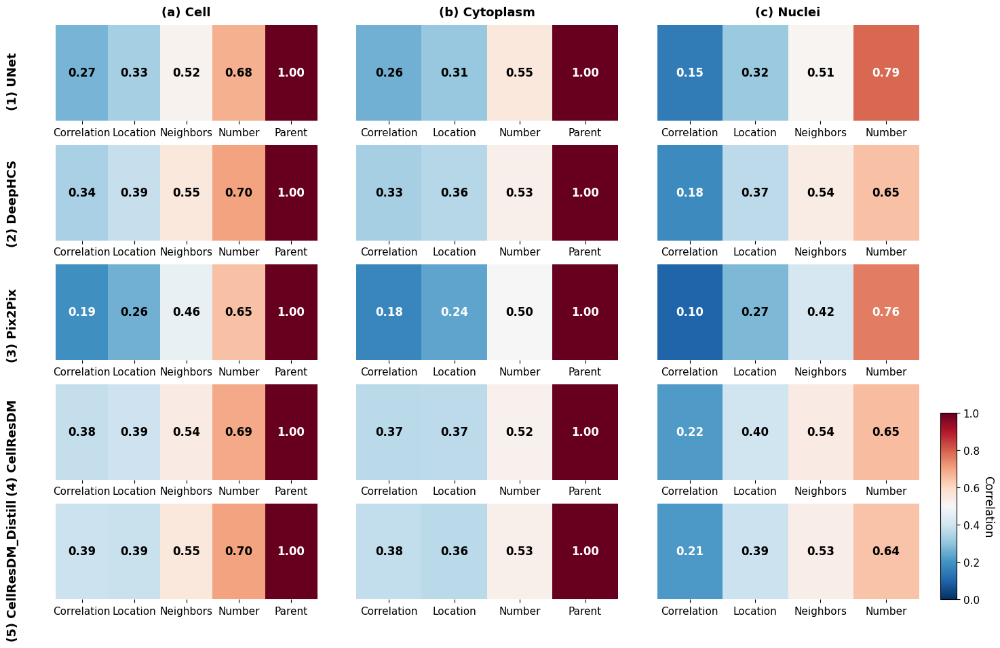


Figure 5 style visualization created!


In [20]:
# Create Figure 5 style visualization
import matplotlib.pyplot as plt
import numpy as np

# Method mapping to match your actual folder names
method_display_names = {
    'unet': 'UNet',
    'pix2pix': 'Pix2Pix', 
    'deephcs': 'DeepHCS',  # Fixed typo: deephsc -> deephcs
    'rescellDM': 'CellResDM',
    'rescellDM_Distill': 'CellResDM_Distill'
}

# Specify the desired order for the methods
ordered_method_names = ['unet', 'deephcs', 'pix2pix', 'rescellDM', 'rescellDM_Distill']  # Fixed typo: deephsc -> deephcs
# Only include methods that are present in the results
method_names = [m for m in ordered_method_names if m in morphological_correlations]

object_types = ['cells', 'cytoplasm', 'nuclei']
object_titles = ['(a) Cell', '(b) Cytoplasm', '(c) Nuclei']

print("Creating Figure 5 style visualization...")
print(f"Methods: {method_names}")
print(f"Morphological feature types: {morphological_feature_types}")

# Get the actual number of features from the correlation data
num_features = len(morphological_correlations[method_names[0]]['cells'])
print(f"Number of morphological features: {num_features}")

# Indices for each object type to keep (remove 'neighbors' for cytoplasm, remove last column for nuclei)
# Assume 'neighbors' is always the third feature (index 2) if it exists
if num_features > 2 and len(morphological_feature_types) > 2 and morphological_feature_types[2].lower() == 'neighbors':
    cytoplasm_indices = [i for i in range(num_features) if i != 2]  # remove neighbors index
else:
    cytoplasm_indices = list(range(num_features))  # keep all if neighbors not found

nuclei_indices = list(range(min(num_features - 1, num_features)))  # remove last column if possible
cells_indices = list(range(num_features))  # keep all

# Ensure indices don't exceed the actual number of features
cytoplasm_indices = [i for i in cytoplasm_indices if i < num_features]
nuclei_indices = [i for i in nuclei_indices if i < num_features]
cells_indices = [i for i in cells_indices if i < num_features]

object_indices = [cells_indices, cytoplasm_indices, nuclei_indices]

print(f"Object indices: {object_indices}")

# Create figure with subplots (methods as rows, object types as columns)
num_methods = len(method_names)

# Use gridspec to allow for a colorbar outside the lower right of the grid
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(16, 2 * num_methods + 1))
gs = gridspec.GridSpec(num_methods, 3, figure=fig, wspace=0.15, hspace=0.25, right=0.92, bottom=0.08, top=0.85)

axes = np.empty((num_methods, 3), dtype=object)
for i in range(num_methods):
    for j in range(3):
        axes[i, j] = fig.add_subplot(gs[i, j])

# If only one method, make sure axes is 2D
if num_methods == 1:
    axes = axes.reshape(1, -1)

# Create heatmaps for each method and object type, in the specified order
for method_idx, method_name in enumerate(method_names):
    method_correlations = morphological_correlations[method_name]
    
    for obj_idx, (obj_type, obj_title) in enumerate(zip(object_types, object_titles)):
        correlation_vector = method_correlations[obj_type]
        indices = object_indices[obj_idx]
        
        # Ensure indices are valid for the correlation vector
        valid_indices = [i for i in indices if i < len(correlation_vector)]
        
        filtered_vector = correlation_vector[valid_indices]
        filtered_feature_types = [morphological_feature_types[i] for i in valid_indices if i < len(morphological_feature_types)]
        
        # If we don't have enough feature type names, create generic ones
        if len(filtered_feature_types) < len(filtered_vector):
            for i in range(len(filtered_feature_types), len(filtered_vector)):
                filtered_feature_types.append(f'Feature_{i}')
        
        # Reshape to matrix format (1 x N for the selected morphological types)
        matrix = filtered_vector.reshape(1, -1)
        
        ax = axes[method_idx, obj_idx]
        
        # Create heatmap with same color scheme as Figure 5
        im = ax.imshow(matrix, cmap='RdBu_r', vmin=0, vmax=1.0, aspect='auto')
        
        # Set title (only for top row)
        if method_idx == 0:
            ax.set_title(obj_title, fontsize=13, fontweight='bold', pad=10)
        
        # Set x-axis labels (filtered morphological feature types)
        ax.set_xticks(range(len(filtered_feature_types)))
        ax.set_xticklabels(filtered_feature_types, rotation=0, fontsize=11)
        
        # Remove y-axis labels and ticks (single row per method)
        ax.set_yticks([])
        
        # Add correlation values as text
        for j in range(len(filtered_vector)):
            val = filtered_vector[j]
            # Choose text color for contrast
            text_color = "white" if val > 0.75 or val < 0.25 else "black"
            ax.text(j, 0, f'{val:.2f}', 
                   ha="center", va="center", color=text_color, fontsize=12, fontweight='bold')
        
        # Remove spines for cleaner look
        for spine in ax.spines.values():
            spine.set_visible(False)

# Add colorbar to the lower right, outside the grid
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Create a new axes for the colorbar at the lower right
# [left, bottom, width, height] in figure coordinates
cbar_width = 0.015
cbar_height = 0.25
cbar_left = 0.94
cbar_bottom = 0.08  # align with bottom of grid

cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cax)
cbar.set_label("Correlation", rotation=270, labelpad=15, fontsize=12)
cbar.ax.tick_params(labelsize=11)

# Add method labels on the left, in the specified order
for method_idx, method_name in enumerate(method_names):
    y_pos = 1 - (method_idx + 0.15) / num_methods * (0.82) - 0.2 # scale to grid height
    display_name = method_display_names.get(method_name, method_name)
    fig.text(0.08, y_pos, f'({method_idx + 1}) {display_name}', 
             ha='left', va='center', rotation=90, fontsize=13, fontweight='bold')

plt.tight_layout(rect=[0.08, 0.08, 0.92, 0.85])
plt.show()

print("\nFigure 5 style visualization created!")


In [21]:
# Save morphological correlation results to CSV
print("Saving morphological correlation results...")

# Create detailed morphological correlation dataframe
morphological_records = []

for method_name in method_names:
    for obj_idx, obj_type in enumerate(object_types):
        correlation_vector = morphological_correlations[method_name][obj_type]
        
        for feat_idx, feature_type in enumerate(morphological_feature_types):
            morphological_records.append({
                'Method': method_name,
                'Object_Type': obj_type.title(),
                'Morphological_Feature_Type': feature_type,
                'Correlation': correlation_vector[feat_idx]
            })

morphological_df = pd.DataFrame(morphological_records)

# Save to CSV
morphological_df.to_csv('morphological_feature_correlations.csv', index=False)
print("  Saved morphological_feature_correlations.csv")

# Print summary statistics
print("\nSummary of morphological feature correlations:")
print("="*60)

for method_name in method_names:
    method_data = morphological_df[morphological_df['Method'] == method_name]
    display_name = method_display_names.get(method_name, method_name)
    print(f"\n{display_name} ({method_name}):")
    
    for obj_type in ['Cells', 'Cytoplasm', 'Nuclei']:
        obj_data = method_data[method_data['Object_Type'] == obj_type]
        mean_corr = obj_data['Correlation'].mean()
        print(f"  {obj_type}: mean correlation = {mean_corr:.3f}")
        
        # Show individual feature type correlations
        for feature_type in morphological_feature_types:
            feat_corr = obj_data[obj_data['Morphological_Feature_Type'] == feature_type]['Correlation'].iloc[0]
            print(f"    {feature_type}: {feat_corr:.3f}")
    
    # Overall mean for this method
    overall_mean = method_data['Correlation'].mean()
    print(f"  Overall mean: {overall_mean:.3f}")

# Show sample of the data
print(f"\nSample of morphological correlation data:")
print(morphological_df.head(15).to_string(index=False))

print(f"\nMorphological analysis complete!")
print(f"Total data points: {len(morphological_df)}")
print(f"Methods: {method_names}")
print(f"Morphological feature types: {morphological_feature_types}")


Saving morphological correlation results...
  Saved morphological_feature_correlations.csv

Summary of morphological feature correlations:

UNet (unet):
  Cells: mean correlation = 0.559
    Correlation: 0.268
    Location: 0.333
    Neighbors: 0.516
    Number: 0.679
    Parent: 1.000
  Cytoplasm: mean correlation = 0.425
    Correlation: 0.261
    Location: 0.309
    Neighbors: 0.000
    Number: 0.554
    Parent: 1.000
  Nuclei: mean correlation = 0.353
    Correlation: 0.150
    Location: 0.315
    Neighbors: 0.512
    Number: 0.788
    Parent: 0.000
  Overall mean: 0.446

DeepHCS (deephcs):
  Cells: mean correlation = 0.595
    Correlation: 0.339
    Location: 0.386
    Neighbors: 0.551
    Number: 0.700
    Parent: 1.000
  Cytoplasm: mean correlation = 0.443
    Correlation: 0.332
    Location: 0.359
    Neighbors: 0.000
    Number: 0.526
    Parent: 1.000
  Nuclei: mean correlation = 0.346
    Correlation: 0.180
    Location: 0.369
    Neighbors: 0.535
    Number: 0.648
    Paren

In [22]:
# COMPREHENSIVE MORPHOLOGICAL FEATURE ANALYSIS WITH COLOR COMPOSITE
print("="*80)
print("COMPREHENSIVE MORPHOLOGICAL FEATURE ANALYSIS")
print("="*80)

# First, let's identify ALL morphological feature categories in the data
sample_df = real_data['cells']
all_feature_prefixes = set()

for col in sample_df.columns:
    if '_' in col and not col.startswith('Metadata'):
        prefix = col.split('_')[0]
        all_feature_prefixes.add(prefix)

print("ALL available morphological feature categories:")
morphological_feature_types = sorted(all_feature_prefixes)
print(morphological_feature_types)

# Define the specific ones we want to analyze (based on the image)
target_morphological_categories = ['Correlation', 'Location', 'Neighbors', 'Number', 'Parent']

# Check which ones are actually available
available_morphological_categories = []
for category in target_morphological_categories:
    if category in morphological_feature_types:
        available_morphological_categories.append(category)
        
print(f"\nAvailable target categories: {available_morphological_categories}")

# If some target categories are missing, add the most relevant available ones
if len(available_morphological_categories) < 5:
    for category in morphological_feature_types:
        if category not in available_morphological_categories and len(available_morphological_categories) < 5:
            if category not in ['ImageNumber', 'ObjectNumber', 'Metadata']:
                available_morphological_categories.append(category)

print(f"Final morphological categories to analyze: {available_morphological_categories}")

# Function to get all features for a morphological category (regardless of channel)
def get_all_morphological_features(df, category):
    """Get ALL features for a specific morphological category"""
    matching_cols = []
    
    for col in df.columns:
        if col.startswith(category + '_'):
            matching_cols.append(col)
    
    return matching_cols

# Test the function
print(f"\nTesting feature extraction:")
for category in available_morphological_categories:
    features = get_all_morphological_features(sample_df, category)
    print(f"{category}: {len(features)} features")
    if len(features) > 0:
        print(f"  Examples: {features[:3]}")
    print()


COMPREHENSIVE MORPHOLOGICAL FEATURE ANALYSIS
ALL available morphological feature categories:
['AreaShape', 'Children', 'Correlation', 'Granularity', 'Intensity', 'Location', 'Neighbors', 'Number', 'Parent', 'RadialDistribution', 'Texture']

Available target categories: ['Correlation', 'Location', 'Neighbors', 'Number', 'Parent']
Final morphological categories to analyze: ['Correlation', 'Location', 'Neighbors', 'Number', 'Parent']

Testing feature extraction:
Correlation: 80 features
  Examples: ['Correlation_Correlation_AGP_DNA', 'Correlation_Correlation_AGP_ER', 'Correlation_Correlation_AGP_Mito']

Location: 33 features
  Examples: ['Location_CenterMassIntensity_X_AGP', 'Location_CenterMassIntensity_X_DNA', 'Location_CenterMassIntensity_X_ER']

Neighbors: 14 features
  Examples: ['Neighbors_AngleBetweenNeighbors_5', 'Neighbors_AngleBetweenNeighbors_Adjacent', 'Neighbors_FirstClosestDistance_5']

Number: 1 features
  Examples: ['Number_Object_Number']

Parent: 1 features
  Examples: [